In [ ]:
#!pip install tensorflow

In [ ]:
import zipfile
import os
import pathlib

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model

# 1.  Data Preparation

### download the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Verify the path to your dataset. If it is incorrect this will fix the path
# Update the path to your dataset directory
dataset_url = "/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFOOD50-v1/train/"
path_dir = pathlib.Path(dataset_url)

### check for images which is not in jpeg or corrupted

In [ ]:
image_count = len(list(path_dir.glob('*/*.jpg')))
print(image_count)

13819


In [ ]:
# Loop through each file in the subdirectories and print paths of non-.jpg files
non_jpg_files = [img for img in path_dir.glob('*/*') if img.is_file() and img.suffix.lower() != '.jpg']
non_jpg_count = len([img for img in path_dir.glob('*/*') if img.is_file() and img.suffix.lower() != '.jpg'])

print(f"Count of non-.jpg files: {non_jpg_count}")
print("Locations of non-.jpg files:")
for file_path in non_jpg_files:
    print(file_path)

KeyboardInterrupt: 

In [ ]:
# Get filepaths and labels
filepaths = list(path_dir.glob(r'**/*.JPG')) + list(path_dir.glob(r'**/*.jpg')) + list(path_dir.glob(r'**/*.png')) + list(path_dir.glob(r'**/*.png'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

In [ ]:
labels_cleaned = labels.drop_duplicates()

In [ ]:
labels_cleaned

,Label
0,EggsStewed
375,FriedKale
774,Dumpling
1131,GaengJued
1581,FriedMusselPancakes
1761,BitterMelonSoup
2001,FriedChicken
2267,BooPadPongali
2697,CurriedFishCake
3081,GaengKeawWan


In [ ]:
image_df

,Filepath,Label
0,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,EggsStewed
1,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,EggsStewed
2,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,EggsStewed
3,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,EggsStewed
4,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,EggsStewed
...,...,...
13814,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,Roast_fish
13815,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,Roast_fish
13816,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,Roast_fish
13817,/content/drive/MyDrive/cnn-thfood/TH-FOOD/THFO...,Roast_fish


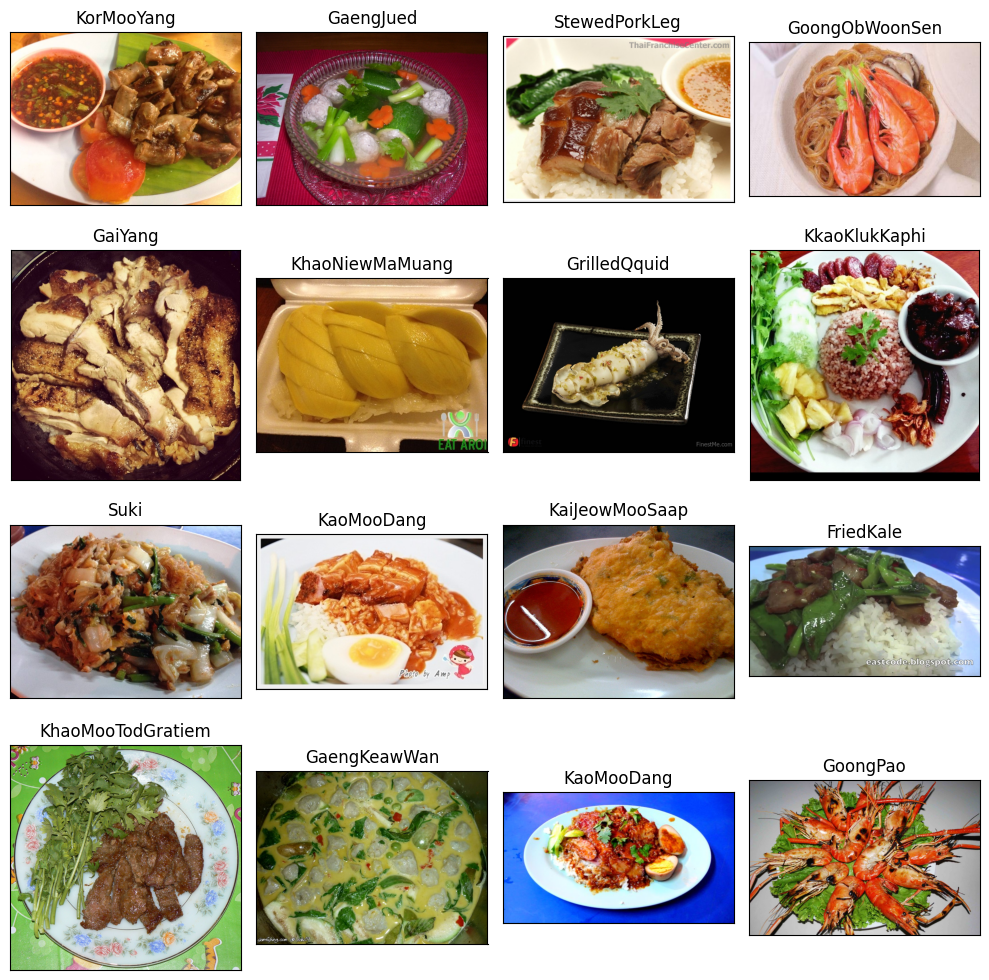

In [ ]:
# Display 16 picture of the dataset with their labels
random_index = np.random.randint(0, len(image_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v3.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v3.preprocess_input
)

In [ ]:
# Split the data into three categories.
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 8844 validated image filenames belonging to 50 classes.
Found 2211 validated image filenames belonging to 50 classes.
Found 2764 validated image filenames belonging to 50 classes.


In [ ]:
# prompt: how to obtain a list of class names of this train dataset

class_list = train_images.class_indices.keys()

In [ ]:
class_list

dict_keys(['BitterMelonSoup', 'BooPadPongali', 'CurriedFishCake', 'Dumpling', 'EggsStewed', 'FriedChicken', 'FriedKale', 'FriedMusselPancakes', 'GaengJued', 'GaengKeawWan', 'GaiYang', 'GoongObWoonSen', 'GoongPao', 'GrilledQquid', 'HoyKraeng', 'HoyLaiPrikPao', 'Joke', 'KaiJeowMooSaap', 'KaiThoon', 'KaoManGai', 'KaoMooDang', 'KhanomJeenNamYaKati', 'KhaoMokGai', 'KhaoMooTodGratiem', 'KhaoNiewMaMuang', 'KkaoKlukKaphi', 'KorMooYang', 'KuaKling', 'KuayJab', 'KuayTeowReua', 'LarbMoo', 'MassamanGai', 'MooSatay', 'NamTokMoo', 'PadPakBung', 'PadPakRuamMit', 'PadThai', 'PadYordMala', 'PhatKaphrao', 'PorkStickyNoodles', 'Roast_duck', 'Roast_fish', 'Somtam', 'SonInLawEggs', 'StewedPorkLeg', 'Suki', 'TomKhaGai', 'TomYumGoong', 'YamWoonSen', 'Yentafo'])

In [ ]:
# Resize Layer
resize_and_rescale = tf.keras.Sequential([
  layers.Resizing(224,224),
  layers.Rescaling(1./255),
])

In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.MobileNetV3Large(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Create checkpoint callback
checkpoint_path = "/content/drive/MyDrive/cnn-thfood/new_mobilecp-{epoch:04d}.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

In [ ]:
# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

In [ ]:
inputs = pretrained_model.input
x = resize_and_rescale(inputs)

x = Dense(256, activation='relu')(pretrained_model.output)
x = Dropout(0.2)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)


outputs = Dense(50, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(
    optimizer=Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=75,
    callbacks=[
        early_stopping,
        checkpoint_callback,
    ]
)

Epoch 1/75


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


277/277 ━━━━━━━━━━━━━━━━━━━━ 4359s 15s/step - accuracy: 0.0164 - loss: 4.4072 - val_accuracy: 0.0425 - val_loss: 3.8949
Epoch 2/75
277/277 ━━━━━━━━━━━━━━━━━━━━ 158s 378ms/step - accuracy: 0.0365 - loss: 3.9747 - val_accuracy: 0.0963 - val_loss: 3.6804
Epoch 3/75
276/277 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - accuracy: 0.0738 - loss: 3.7473

In [ ]:
model.save("/content/drive/MyDrive/cnn-thfood/mobile_model.h5")

In [ ]:
model.save("/content/drive/MyDrive/cnn-thfood/mobile_kmodel.keras")

### Run prediction accuracy on the saved model


In [ ]:
# Load the full saved model
model = tf.keras.models.load_model("/content/drive/MyDrive/cnn-thfood/mobile61_kmodel.keras")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 8 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Step 2: Evaluate the model on the test dataset
# Assuming test_ds is your test dataset
loss, accuracy = model.evaluate(test_images)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 1085s 13s/step - accuracy: 0.7741 - loss: 0.8337
Test Loss: 0.8416484594345093
Test Accuracy: 0.7680897116661072


### prediction samples

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

87/87 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step


In [ ]:
# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

In [ ]:
# Display the result
print(f'The first 5 predictions: {pred[:5]}')

The first 5 predictions: ['GaengJued', 'Roast_duck', 'Roast_fish', 'FriedKale', 'StewedPorkLeg']


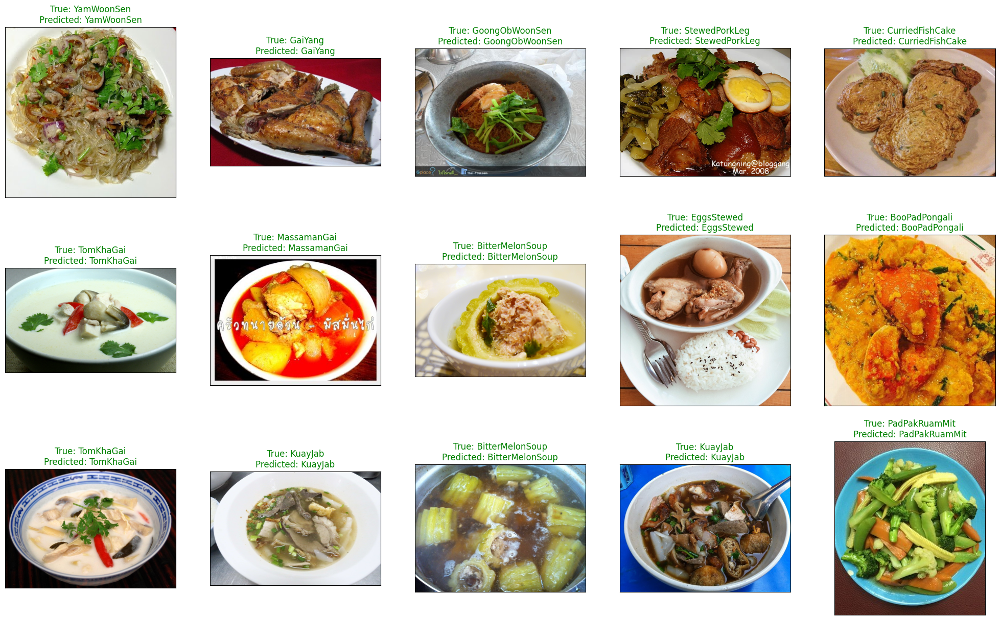

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

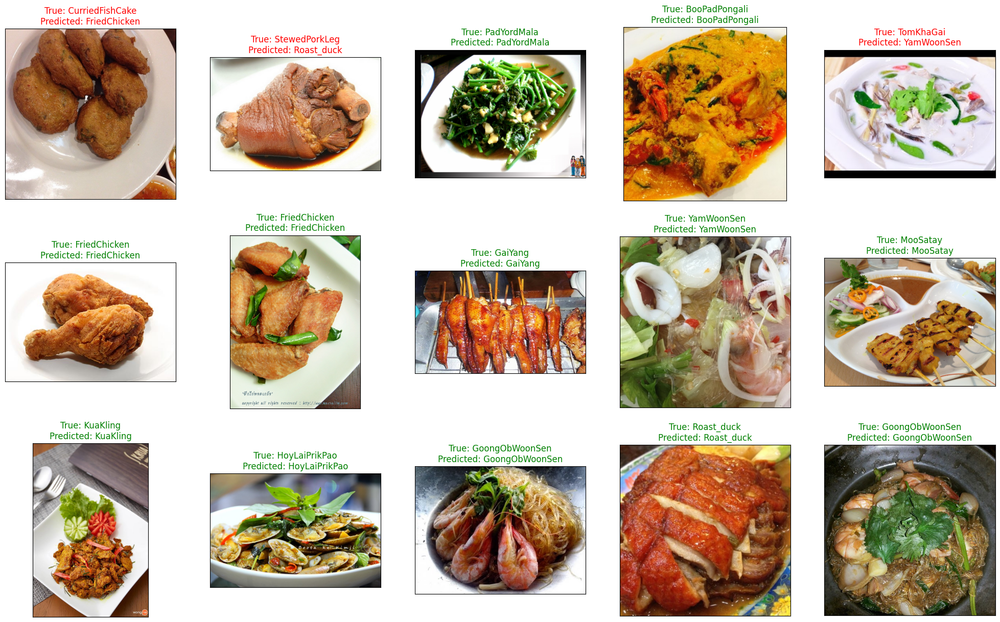

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

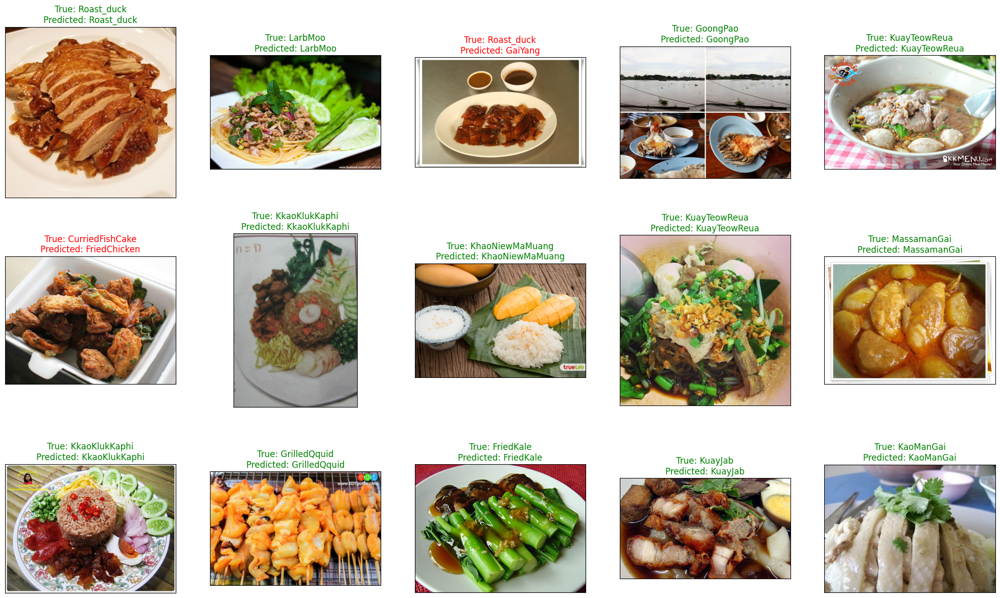

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

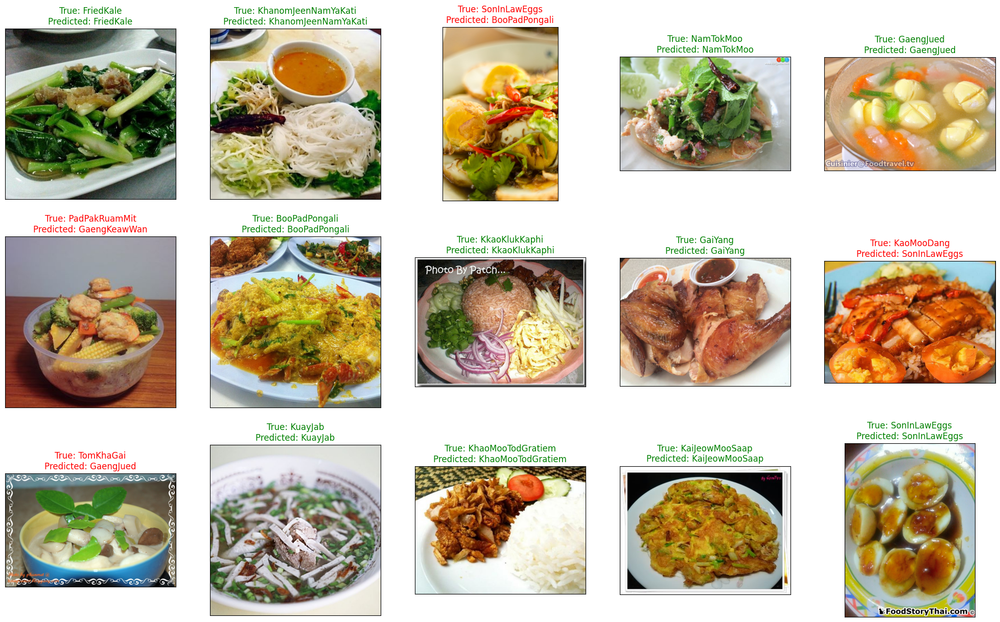

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

### continue the next epochs to train the model

In [ ]:
inputs = pretrained_model.input
x = resize_and_rescale(inputs)

x = Dense(256, activation='relu')(pretrained_model.output)
x = Dropout(0.2)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)


outputs = Dense(50, activation='softmax')(x)

model_load_new = Model(inputs=inputs, outputs=outputs)

In [ ]:
# Load the saved weights (make sure the path and filename are correct)
model_load_new.load_weights("/content/drive/MyDrive/cnn-thfood/new_mobilecp-0159.weights.h5")

In [ ]:
model_load_new.compile(
    optimizer=Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Continue training
history = model_load_new.fit(train_images,
                    validation_data=val_images,
                    epochs=180,           # Total final epoch number
                    initial_epoch=159,    # Set to the epoch number from the saved weight
                    callbacks=[
                        early_stopping,
                        checkpoint_callback,
                    ]
)

Epoch 160/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 3024s 11s/step - accuracy: 0.8786 - loss: 0.4356 - val_accuracy: 0.8245 - val_loss: 0.6214
Epoch 161/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 471s 2s/step - accuracy: 0.8719 - loss: 0.4376 - val_accuracy: 0.8263 - val_loss: 0.6195
Epoch 162/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 467s 2s/step - accuracy: 0.8759 - loss: 0.4115 - val_accuracy: 0.8232 - val_loss: 0.6207
Epoch 163/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 462s 2s/step - accuracy: 0.8782 - loss: 0.4284 - val_accuracy: 0.8281 - val_loss: 0.6188
Epoch 164/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 469s 2s/step - accuracy: 0.8773 - loss: 0.4211 - val_accuracy: 0.8281 - val_loss: 0.6178
Epoch 165/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 470s 2s/step - accuracy: 0.8685 - loss: 0.4342 - val_accuracy: 0.8299 - val_loss: 0.6185
Epoch 166/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 503s 2s/step - accuracy: 0.8789 - loss: 0.4083 - val_accuracy: 0.8259 - val_loss: 0.6165
Epoch 167/180
277/277 ━━━━━━━━━━━━━━━━━━━━ 469s 2s/step - accuracy: 0.8686

In [ ]:
model_load_new.save("/content/drive/MyDrive/cnn-thfood/mobile180_kmodel.keras")

### Evaluating & Prediction for 100 epoch trained model

In [ ]:
# Load the full saved model
model_load = tf.keras.models.load_model("/content/drive/MyDrive/cnn-thfood/mobile180_kmodel.keras")

In [ ]:
# Step 2: Evaluate the model on the test dataset
# Assuming test_ds is your test dataset
loss, accuracy = model_load.evaluate(test_images)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

87/87 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8214 - loss: 0.5995
Test Loss: 0.6084286570549011
Test Accuracy: 0.8172937631607056


In [ ]:
# Predict the label of the test_images
pred = model_load.predict(test_images)
pred = np.argmax(pred,axis=1)

87/87 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step


In [ ]:
# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

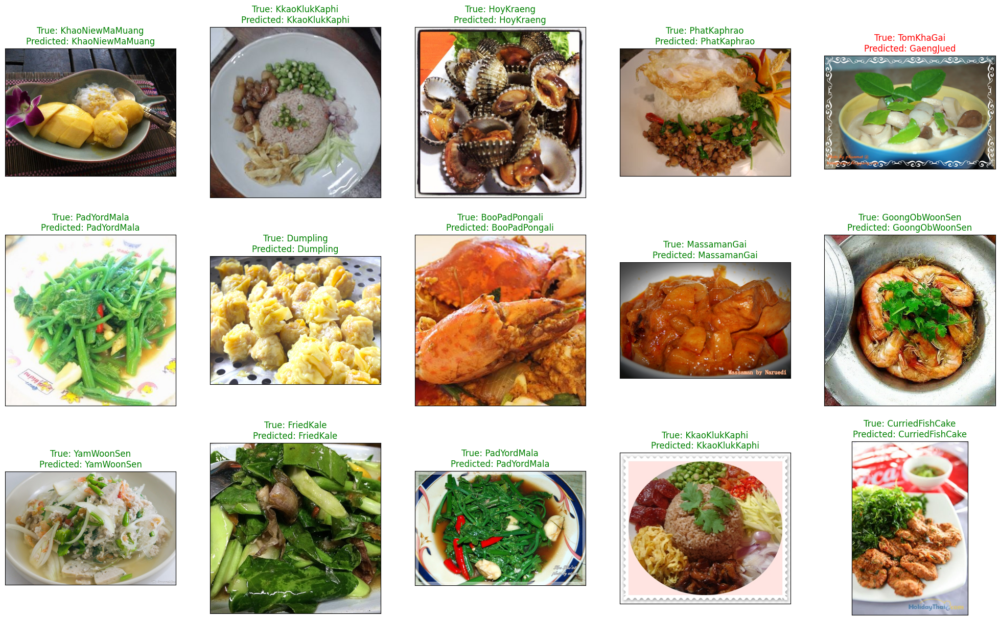

<Figure size 640x480 with 0 Axes>

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [ ]:
inputs = pretrained_model.input
x = resize_and_rescale(inputs)

x = Dense(256, activation='relu')(pretrained_model.output)
x = Dropout(0.2)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)


outputs = Dense(50, activation='softmax')(x)

model_load_new2 = Model(inputs=inputs, outputs=outputs)

In [ ]:
# Step 2: Load the weights
model_load_new2.load_weights("/content/drive/MyDrive/cnn-thfood/new_mobilecp-0178.weights.h5")

In [ ]:
model_load_new2.compile(
    optimizer=Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model_load_new2.save("/content/drive/MyDrive/cnn-thfood/mobile178_kmodel.keras")

In [ ]:
loss, accuracy = model_load_new2.evaluate(test_images)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 738s 9s/step - accuracy: 0.8204 - loss: 0.6146
Test Loss: 0.6226945519447327
Test Accuracy: 0.8162084221839905


### Loop of prediction accuracy

In [ ]:
inputs = pretrained_model.input
x = resize_and_rescale(inputs)

x = Dense(256, activation='relu')(pretrained_model.output)
x = Dropout(0.2)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)

outputs = Dense(50, activation='softmax')(x)

model_load_new3 = Model(inputs=inputs, outputs=outputs)


epoch_files = [158, 159, 160, 163, 165, 168, 178]

for epoch in epoch_files:
  weight_file = 'new_mobilecp-0' + f'{epoch}' + '.weights.h5'

  model_load_new3.load_weights(f"/content/drive/MyDrive/cnn-thfood/{weight_file}")

  model_load_new3.compile(
    optimizer=Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
  )

  loss, accuracy = model_load_new3.evaluate(test_images)
  print(f'Accuracy of epoch = {weight_file}')
  print(f"     Test Loss: {loss}")
  print(f"     Test Accuracy: {accuracy}")






87/87 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8221 - loss: 0.6135
Accuracy of epoch = new_mobilecp-0158.weights.h5
     Test Loss: 0.6218711137771606
     Test Accuracy: 0.8151230216026306


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


87/87 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - accuracy: 0.8204 - loss: 0.6146
Accuracy of epoch = new_mobilecp-0159.weights.h5
     Test Loss: 0.6226945519447327
     Test Accuracy: 0.8162084221839905
87/87 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8200 - loss: 0.6118
Accuracy of epoch = new_mobilecp-0160.weights.h5
     Test Loss: 0.6205983757972717
     Test Accuracy: 0.8143994212150574
87/87 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.8209 - loss: 0.6112
Accuracy of epoch = new_mobilecp-0163.weights.h5
     Test Loss: 0.6194287538528442
     Test Accuracy: 0.8180173635482788
87/87 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8218 - loss: 0.6110
Accuracy of epoch = new_mobilecp-0165.weights.h5
     Test Loss: 0.6192223429679871
     Test Accuracy: 0.8165701627731323
87/87 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.8228 - loss: 0.6060
Accuracy of epoch = new_mobilecp-0168.weights.h5
     Test Loss: 0.6157617568969727
     Test Accuracy: 0.8180173635482788
87/87 ━━━━━━━━━

# Best model is epoch = 178